<a href="https://colab.research.google.com/github/kraicwt/kraicwt/blob/master/Seminar_RoleofData_ModelBuilding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Examples of demonstration in the review:** <br>

## <a href="https://www.mdpi.com/1099-4300/20/10/807">The Role of Data in Model Building and prediction: A survey Through Examples</a>

In [213]:
%matplotlib inline

import numpy as np
import numpy.linalg as la
from scipy.linalg import toeplitz 
from random import sample 

from scipy.integrate import solve_ivp
from scipy.stats import linregress

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation 
from IPython.display import HTML

## Lorenz'96 system

### General properties

Consider a system of $N$ variables, $X_n$ for $n = 1,\ldots, N$ which Edward Lorenz introduced as a heuristic model that help us understand chaos in quite a generic system (but how did he obtain this model in the first place!?). The model we dubbed <a href="https://eapsweb.mit.edu/sites/default/files/Predicability_a_Problem_2006.pdf">"Lorenz'96 model"</a>:

\begin{equation}
\frac{dX_n}{dt} = X_{n-1}(X_{n+1}-X_{n-2}) - X_n + F \quad ,\quad n = 1,\ldots,N
\end{equation}

with periodic boundary condition $X_{n\pm N} = X_n$

In [214]:
# define the ODEs system 
def Lorenz96(t, X, F):   
    N = np.size(X) 
    Xm1 = np.array([X[i-1] for i in range(N)])     # X_{n-1}
    Xp1 = np.array([X[(i+1)%N] for i in range(N)]) # X_{n+1}
    Xm2 = np.array([X[i-2] for i in range(N)])     # X_{n-2}

    dX = Xm1*(Xp1 - Xm2) - X + F
    return dX    

In [215]:
# this model need only two parameters: N and F, play with it as you want!
N = 64
F = 10.0
T = 100 # time from t = 0 to t = T

# random initial condition
X0 = 2*np.random.rand(N)-1  # X0 is in [-1,1]

# solve it
# dense_output = True allows the solution to be interpolated
sol = solve_ivp(Lorenz96, [0, T], X0, args = [F], dense_output=True,
                method="RK45", max_step=0.1)

the interpolated solution is in <code>sol.sol</code> where the solution at time $t$ is called with <code>sol.sol(t)</code>

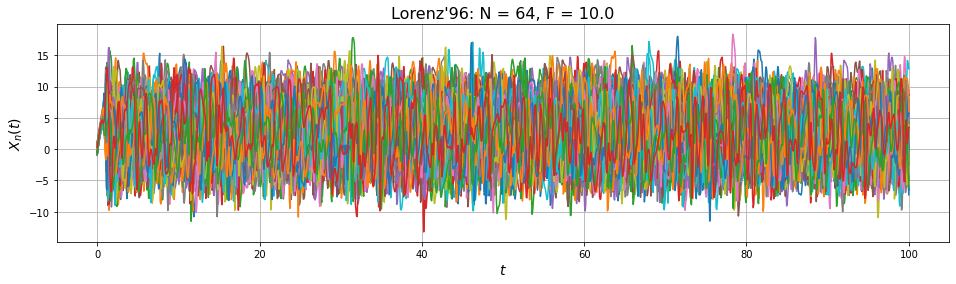

In [216]:
# this plot isn't so informative, matrix plot below looks nicer when N is large
plt.figure(figsize = (16,4))
plt.plot(sol.t, (sol.y).T)
plt.title(f"Lorenz'96: N = {N}, F = {F}", fontsize = 16)
plt.ylabel("$X_n(t)$", fontsize = 14)
plt.xlabel("$t$", fontsize = 14)
plt.grid()
plt.show()

Let's look at the cross section, $X_{1:N}$ at many time slices

In [217]:
# This will take about few minutes or so to run (if N is not too large)
fig = plt.figure(figsize = (10,4))
ax = plt.axes(xlim=(0,N+1), ylim=(np.min(sol.y)-1, np.max(sol.y)+1))
ax.set_title(f"Lorenz'96 system: N = {N}, F = {F}", fontsize = 16)
ax.set_xlabel("site", fontsize = 14)
ax.set_ylabel("$X_n$", fontsize = 14)
ax.set_xticks(range(1,N+1,5))

scat = ax.scatter([],[], color = "blue")
ax.grid()

def animate(frame, sol):
    N = sol.y.shape[0]
    data = np.vstack((range(1,N+1), sol.y.T[frame])).T
    scat.set_offsets(data)
    return scat

anim = FuncAnimation(fig, animate, frames = len(sol.t), fargs = (sol,), interval = 75)
plt.close()
HTML(anim.to_html5_video()) 
# once it is renderd in HTML, it can run indefinitely even after we close it

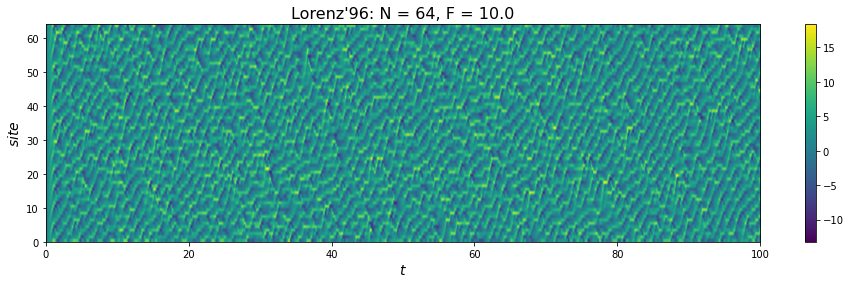

In [218]:
# see the solution in space-time picture

plt.figure(figsize = (16,4))
plt.imshow(np.array(sol.y), extent=[0,T,0,N], aspect='auto')
plt.ylabel("$site$", fontsize = 14)
plt.xlabel("$t$", fontsize = 14)
plt.title(f"Lorenz'96: N = {N}, F = {F}", fontsize = 16)
plt.colorbar()
plt.show()

compute the energy of solution $E(t) \sim \sum_{n=1}^{N} X_n^2(t)$

In [219]:
Xmat = np.array(sol.y).T
energy = [ la.norm(Xmat[i])**2 for i in range(Xmat.shape[0])]

❓Try to plot this energy for a solution at low F vs high F, you will see the difference between chaotic and non-chaotic solution

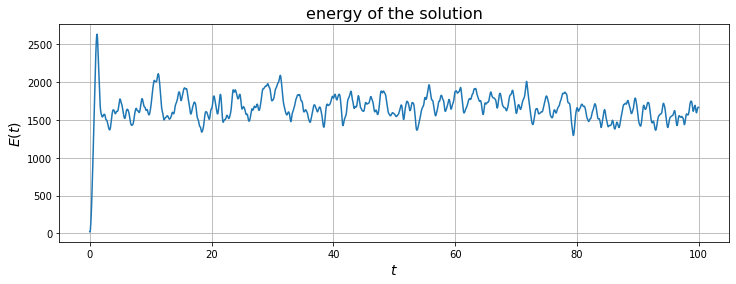

In [220]:
plt.figure(figsize = (12,4))
plt.plot(sol.t, energy)
plt.title("energy of the solution", fontsize = 16)
plt.ylabel("$E(t)$", fontsize = 14)
plt.xlabel("$t$", fontsize = 14)
plt.grid()
plt.show()

Now, to quantify the chaos of this system, we compute the Lyapunov spectrum

### Some predefined functions

we will have to use these functions in the <code>Lyapunov</code> function

In [221]:
# projection of vector v onto vector u
def project(v,u):
    return np.dot(u,v)*u/np.dot(u,u)

# assume each row of the input array is a vector
def GramSchmidt(vec_list):
    assert vec_list.shape[0] == vec_list.shape[1]
    n = vec_list.shape[0]
    ortho_list = [vec_list[0]]

    for i in range(1,n):
        v = vec_list[i] 
        u = np.copy(v) 
        for vec in ortho_list: 
            u -= project(v,vec)

        ortho_list.append(u)
    # give an orthonormal set of vectors
    for i in range(n):
        ortho_list[i] = ortho_list[i]/la.norm(ortho_list[i])
    
    return np.array(ortho_list)

In [ ]:
# test with a set of random vectors
M = np.random.rand(5,5)

In [ ]:
ortho = GramSchmidt(M)

In [ ]:
# test the GramSchmidt function
print("Dot products among them")
for i in range(ortho.shape[0]):
    for j in range(i+1,ortho.shape[1]):
        print(f"{i}, {j}: {np.dot(ortho[i],ortho[j])}")

print("Norm of each vector")
for i in range(ortho.shape[0]):
    print(f"{i}: {la.norm(ortho[i])}")

Dot products among them
0, 1: 2.0816681711721685e-16
0, 2: -3.0184188481996443e-16
0, 3: 4.440892098500626e-16
0, 4: -3.4468955467659157e-15
1, 2: -2.5326962749261384e-16
1, 3: -5.551115123125783e-17
1, 4: -9.410874857174178e-16
2, 3: 5.273559366969494e-16
2, 4: -2.0383000842727483e-16
3, 4: -4.451300439356487e-15
Norm of each vector
0: 0.9999999999999999
1: 0.9999999999999999
2: 1.0
3: 0.9999999999999999
4: 1.0


### Lyapunov spectrum of the Lorenz'96 system

Linearised equation of motion for the deviation $\vec{X}(t) = \vec{X}_0(t) + \vec{\eta}(t)$ of the equation of motion $\dot{X}(t) = \vec{f}\left(\vec{X}(t)\right)$
\begin{equation}
\frac{d\vec{\eta}}{dt} = \mathbf{J}[\vec{X}_0(t)]\cdot\vec{\eta}
\end{equation}
where the elements of the Jacobian matrix are:
\begin{equation}
J_{ij} = \frac{\partial f_i}{\partial X_j} = \delta_{i-1,j}(X_{i+1}-X_{i-2}) + \delta_{i+1,j}X_{i-1} - \delta_{i-2,j}X_{i-1} - \delta_{i,j}
\end{equation}

computing the Jacobian matrix (it works fine as long as $N$ is not too large, not sure how to make the code look nicer given the equation above)

In [222]:
def Jacobian(sol,t):
    X = sol.sol(t)
    N = len(X)
    J = np.zeros((N,N), dtype = np.float64)
    for i in range(N):
        ip1 = (i+1)%N   # i+1 but also cyclic
        for j in [i-2,i-1,i,ip1]:
            if j == i-2:
                J[i,j] = -X[i-1]
            elif j == i-1:
                J[i,j] = X[ip1]-X[i-2] 
            elif j == i:
                J[i,j] = -1.0
            else:
                J[i,j] = X[i-1]      
    return J

In [223]:
# test to see if it work on the interpolated solution at any t
t = 23.45
J = Jacobian(sol,t)

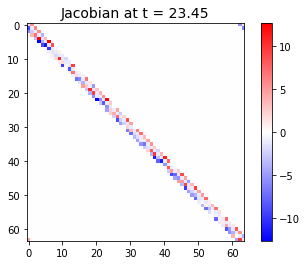

In [224]:
plt.imshow(J, cmap = "bwr")
plt.title(f"Jacobian at t = {t}", fontsize = 14)
plt.colorbar()
plt.show()

Define a set of initial conditions for deviation.
The code can be quite slow because the Jacobian matrix have to be computed four times at every timestep.

In [225]:
# just a standard 4th-order Runge-Kutta evolution of eta at every time interval
def RK4evolve(eta0,sol,tspan):
    dt = tspan[1]-tspan[0]
    eta1 = np.copy(eta0)
    N = eta0.shape[0]
    for i in range(N):
        eta_i = eta1[i]
        for t in tspan:
            k1 = np.dot(Jacobian(sol,t),eta_i)
            k2 = np.dot(Jacobian(sol,t+dt/2), eta_i+k1*dt/2)
            k3 = np.dot(Jacobian(sol,t+dt/2), eta_i+k2*dt/2)
            k4 = np.dot(Jacobian(sol,t+dt), eta_i+k3*dt)
            eta_i += dt*(k1 + 2*k2 + 2*k3 + k4)/6
        eta1[i] = eta_i

    return eta1

the method for calculating the Lyapunov spectrum is quite well-explained in the book <a href="https://mis.kp.ac.rw/admin/admin_panel/kp_lms/files/digital/CoreBooks/Core%20Books%20in%20Mathematics%20%20and%20Physics/E281_%20%20ORDINARY%20DIFFERENTIAL%20EQUATIONS%20[Dominic%20Jordan,%20Peter%20%20Smith]%20Nonlinear%20%20ordinary%20%20d(BookFi).pdf">"Nonlinear Ordinary Differential Equations An Introduction for Scientists and Engineers"</a> Ch.13 (fortunately, I found the link to the free pdf file 😛)

In [226]:
# find Lyapunov spectrum of the solution
def Lyapunov(sol, t_est, nstep = 20):
    assert t_est[0] >= sol.t[0]
    assert t_est[-1] <= sol.t[-1]

    N = sol.y.shape[0]
    lambda_est = np.zeros(N, dtype = np.float64)
    eta0 = np.eye(N, dtype = np.float64)
    
    for (t0,t1) in zip(t_est[0:-1],t_est[1:]):
        tspan = np.linspace(t0,t1,nstep)
        eta1 = RK4evolve(eta0, sol, tspan)
        lambda_est += np.array([ np.log(la.norm(eta)) for eta in eta1])
        eta0 = GramSchmidt(eta1)

    spectrum = lambda_est/(t_est[-1]-t_est[0])
    return spectrum

In [227]:
# chopping time to N intervals (t0, t1, ..., tN) 
# for N = 64 it takes about 20-30 s to run
N_interval = 30
t_est = np.linspace(20,T,N_interval+1)
spectrum = Lyapunov(sol, t_est, nstep = 20)

In [228]:
np.sort(spectrum)

array([2.40395547, 2.40754682, 2.41098135, 2.41251026, 2.43096557,
       2.43954219, 2.44155025, 2.44421756, 2.4450094 , 2.44542087,
       2.44844267, 2.44946388, 2.4504683 , 2.4551091 , 2.45607092,
       2.45708875, 2.45930411, 2.45996313, 2.46008756, 2.46042171,
       2.46094829, 2.46302459, 2.46325284, 2.46326491, 2.46522227,
       2.46543916, 2.46544631, 2.46676464, 2.46981694, 2.47064039,
       2.47211643, 2.47632479, 2.47983687, 2.48139561, 2.4825423 ,
       2.4881996 , 2.48909274, 2.48946779, 2.49196012, 2.49688455,
       2.49956937, 2.51511222, 2.51712471, 2.52178974, 2.52208935,
       2.52389356, 2.5241193 , 2.52494344, 2.52736704, 2.52990839,
       2.53174305, 2.53190328, 2.5344936 , 2.53807874, 2.53808212,
       2.5417223 , 2.54536214, 2.54682466, 2.559896  , 2.56103895,
       2.56179124, 2.56896162, 2.57191407, 2.62659723])

The larger the Lyapunov exponent, the more sensitive the system is to change of initial condition.

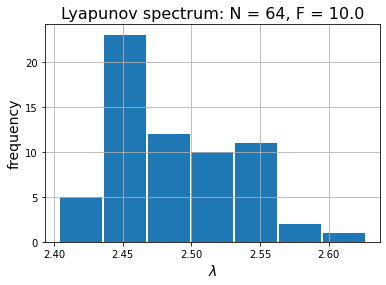

In [236]:
plt.hist(spectrum, bins = "auto", rwidth = 0.96, density = False)
plt.title(f"Lyapunov spectrum: N = {N}, F = {F}",fontsize = 16)
plt.grid()
plt.xlabel("$\lambda$", fontsize = 14)
plt.ylabel("frequency", fontsize = 14)
plt.show()

### Difficulty of predicting chaotic systems

Now we can take the largest Lyapunov exponent to define the timescale (the "horizon") for the predictability of the system called "Lyapunov time"

\begin{equation}
T_{L} = \lambda^{-1}_{\text{max}}
\end{equation}

In [ ]:
lambda_max = spectrum.max()
print("Largest Lyapunov exponent:",lambda_max)

Largest Lyapunov exponent: 0.7556801684237645


In [ ]:
# test how far we can go with the new initial condition which deviate from the old one by just a little
# use the same parameter N, F as before

# new initial condition
delta = 1e-8
X0_new = X0 + delta/np.sqrt(N)

# solve it
# dense_output = True allows the solution to be interpolated
sol_new = solve_ivp(Lorenz96, [0, T], X0_new, args = [F], dense_output=True,
                method="RK45", max_step=0.1)

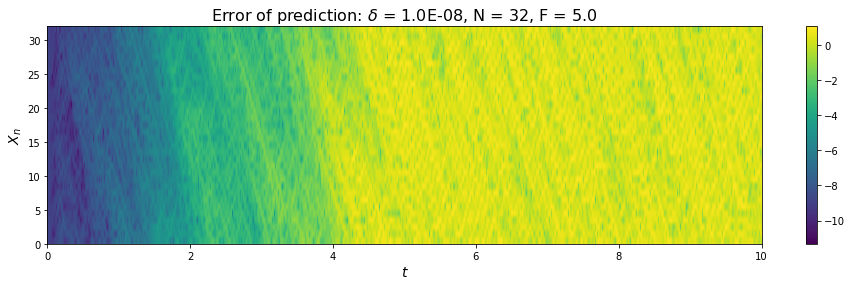

In [ ]:
size = min(len(sol.t), len(sol_new.t))
t = np.linspace(0,T,size)

# showing log_10(Error) in matrix plot
future = 10 
assert future < T
error = np.abs(sol_new.sol(t)-sol.sol(t))

plt.figure(figsize = (16,4))
plt.imshow( np.log10(error) , extent=[0,future,0,N], aspect='auto')
plt.ylabel("$X_n$", fontsize = 14)
plt.xlabel("$t$", fontsize = 14)
plt.title("Error of prediction: "+"$\delta$ = "+f"{delta:.1E}"+f", N = {N}, F = {F}", fontsize = 16)
plt.colorbar()
plt.show()

# the prediction can't go that far into the future

In reality, sometime we don't even have an access to the whole state vector of the system. For example, the system might have $N$ dimension but we only have a time series data for $m < N$ dimensional state vector. <br>

<p>
To reconstruct the phase space of a system, we can rely on <a href="https://en.wikipedia.org/wiki/Takens%27s_theorem">Taken's delay embedding theorem</a>
</p>

In [ ]:
# randomly pick a single channel from the N channels time series.
print("number of channel N:",N)

ch = np.random.randint(0,high = N-1)
print("random channel:",ch)

# the sample channel that we pick
# Xsample has constant timestep
Xsample = sol.sol(t)[ch,:]

number of channel N: 64
random channel: 31


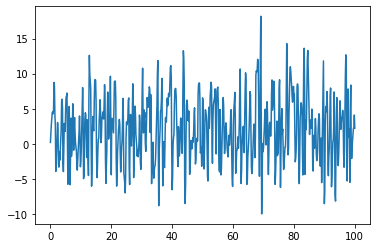

In [ ]:
plt.plot(t,Xsample)
plt.show()

In [ ]:
k = 1  # number of delayed time steps
X_ = Xsample[:-k:k] # original one
X_d = Xsample[k::k] # delayed one
len(X_d)

680

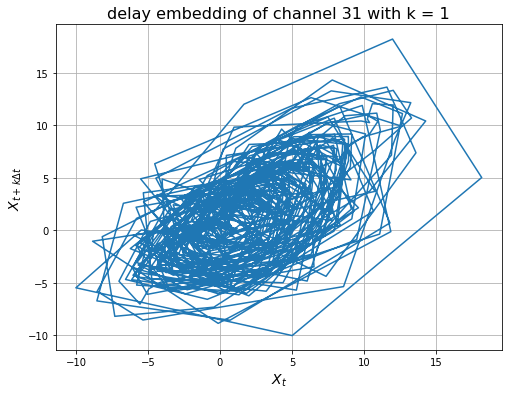

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(X_,X_d) 
plt.xlabel("$X_t$", fontsize = 14)
plt.ylabel("$X_{t+k\Delta t}$", fontsize = 14)
plt.title(f"delay embedding of channel {ch} with k = {k}", fontsize = 16)
plt.grid()
plt.show()

Compute the probablity of finding $\epsilon$-analogue point

In [ ]:
def fraction_analogue(sol, eps = 1.0, M = 1000, n_ref = 100):
    assert n_ref <= M

    t = np.linspace(sol.t[0], sol.t[-1], M)
    X = sol.sol(t).T

    refs = sample(range(M),n_ref)
    refs.sort()

    C = 0.0
    for ref in refs:
        Xref = X[ref]
        num = np.sum(la.norm(X - Xref, axis = 1) <= eps)
        C += num

    return C/(M*n_ref) 

In [ ]:
# we can play with another solution because we want a longer time series
N = 21
F = 5.0
T = 10000 # time from t = 0 to t = T

# random initial condition
X0 = 2*np.random.rand(N)-1  # X0 is in [-1,1]

# solve it
# dense_output = True allows the solution to be interpolated
soln = solve_ivp(Lorenz96, [0, T], X0, args = [F], dense_output=True,
                method="RK45", max_step=0.1)

In [ ]:
eps_list = np.logspace(-1, 1.5, num = 31, endpoint=True)

In [ ]:
# this will take few minutes for a long time series
C_list = []
M = len(soln.t)
r = 1000

for eps in eps_list:
    C = fraction_analogue(soln, eps = eps, M = M, n_ref = r)
    C_list.append(C)

Use linear regression to obtain the scaling law
\begin{equation}
C_{r,M}(\epsilon) = \text{const}\times\left(\frac{\epsilon}{\epsilon_{\text{max}}}\right)^{D_A}
\end{equation}

In [ ]:
# choose eps and C to be interpolated by hand 
eps_inter = (eps_list/np.max(eps_list))[2:-2]
C_inter = C_list[2:-2]

interpolant = linregress(np.log(eps_inter), np.log(C_inter))
D = interpolant.slope
const = interpolant.intercept
print("Atrractor dimension:",D)

Atrractor dimension: 2.2518549677705755


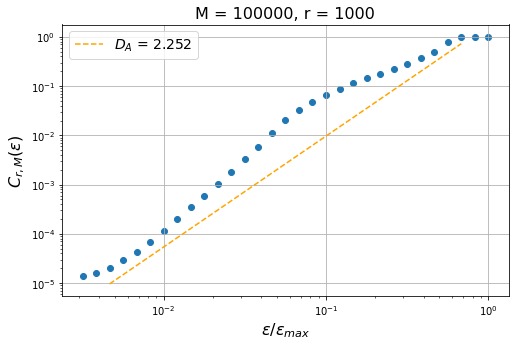

In [ ]:
plt.figure(figsize = (8,5))
plt.plot(eps_inter, const*np.power(eps_inter, D),'--', color = "orange", label = f"$D_A$ = {D:.4}")

plt.scatter(eps_list/np.max(eps_list), C_list)
plt.xlabel("$\epsilon/\epsilon_{\t{max}}$", fontsize = 16)
plt.ylabel("$C_{r,M}(\epsilon)$", fontsize = 16)
plt.xscale("log")
plt.yscale("log")
plt.legend(fontsize = 14)
plt.title("M = 100000, r = 1000", fontsize = 16)
plt.grid()
plt.show()

## Modelling multiscale dynamics with Langevin equation

Consider the model of a harmonic chain with $2N+1$ oscillators where the celtral one (the intruder) has mass $M$ and the rest have mass $m$ so that ($M \gg m$). The Hamiltonian is
\begin{equation}
H = \frac{P^2}{2M}+\sum_{i=\pm1}^{\pm N}\frac{p_i^2}{2m} + \frac{k}{2}\sum_{i = -N}^{N+1}(q_i - q_{i-1})^2
\end{equation}
with boundary condition $q_{N+1} = 0 = q_{-N-1}$. For notational convenience, the canonical variables for the large mass are called $(P,Q)$ such that $P \equiv p_0, Q \equiv q_0$

In [92]:
def HarmonicChain(t, X, M, m, k):
    L = len(X)  # L = 4N+2
    N = (L-2)//4  # index of the center oscillator
    half = L//2 # 2N+1

    Q = X[:half]
    P = X[half:] 

    m_list = np.array([ M if i==N else m for i in range(half)])

    # generate matrix for dp/dt
    ver = np.zeros(2*N+1)
    ver[0] = -2
    ver[1] = 1
    hor = ver
    K = k*toeplitz(ver,hor)

    dQ = P/m_list
    dP = K@Q
    dX = np.hstack((dQ,dP))
    return dX

In [93]:
# half of number of small oscillators
N = 200
# for N = 200 (total 401 oscillators, dt = 0.001, T = 10) is takes about 45 seconds to run

# physical parameters
M = 200
m = 1
k = 2000

# initial condition
Q0 = 2*np.random.rand(2*N+1)-1
P0 = np.zeros(2*N+1)    # all have zero initial momenta
X_init = np.hstack( (Q0,P0) )

T = 20 # time from t = 0 to t = T

# solve it
# dense_output = True allows the solution to be interpolated
hsol = solve_ivp(HarmonicChain, [0, T], X_init, args = [M,m,k], dense_output=True,
                method="RK45", max_step=0.001)

In [94]:
# obtain the solution for positions and momenta separately
X = hsol.y.T
qsol = X[:,0:2*N+1]
psol = X[:,2*N+1:]

# position and momentum of the heavy oscillator
Q = qsol[:,N]
P = psol[:,N]

you can see from the solution that it looks pretty much like the Browninan motion

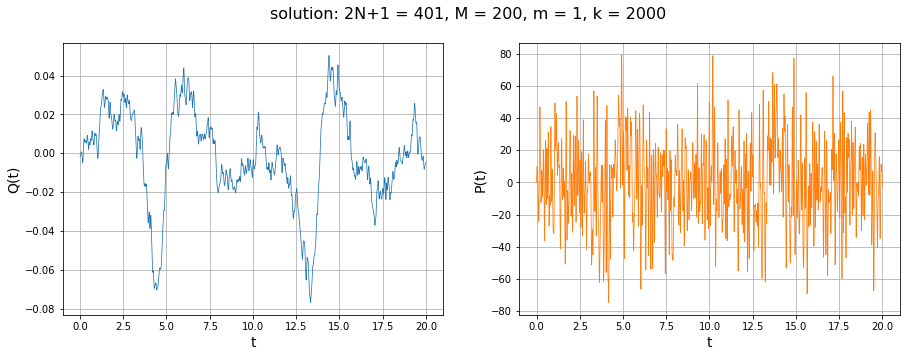

In [95]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
fig.suptitle(f"solution: 2N+1 = {2*N+1}, M = {M}, m = {m}, k = {k}", fontsize = 16)

ax1.plot(hsol.t, Q, lw = 0.75)
ax1.set_xlabel("t", fontsize = 14)
ax1.set_ylabel("Q(t)", fontsize = 14)
ax1.grid()

ax2.plot(hsol.t, P, lw = 0.75 ,color = 'tab:orange')
ax2.set_xlabel("t", fontsize = 14)
ax2.set_ylabel("P(t)", fontsize = 14)
ax2.grid()
plt.show()

See it in the phase space. <br>
*CAUTION: This might a take long time to obtain the animation (for 20000 frames, it took about 26 mins)

In [135]:
fig = plt.figure(figsize = (8,6))

Qmin = np.round(np.min(Q), decimals=2)
Qmax = np.round(np.max(Q), decimals=2)

Pmin = np.round(np.min(P), decimals=0)
Pmax = np.round(np.max(P), decimals=0)

ax = plt.axes(xlim=(Qmin, Qmax), ylim=(Pmin, Pmax))
ax.set_title(f"Harmonic chain: 2N+1 = {2*N+1}, M = {M}, m = {m}, k = {k}", fontsize = 16)
ax.set_xlabel("$Q(t)$", fontsize = 14)
ax.set_ylabel("$P(t)$", fontsize = 14)

scat = ax.scatter([],[], color = "darkviolet")
line, = ax.plot([], [], color = "blueviolet", lw = 0.75)

ax.grid()

def draw(frame, Q, P):
    line.set_data(Q[:frame], P[:frame])
    scat.set_offsets([Q[frame], P[frame]])

phase = FuncAnimation(fig, draw, frames = len(hsol.t), fargs = (Q,P), interval = 10)
plt.close()

HTML(phase.to_html5_video())

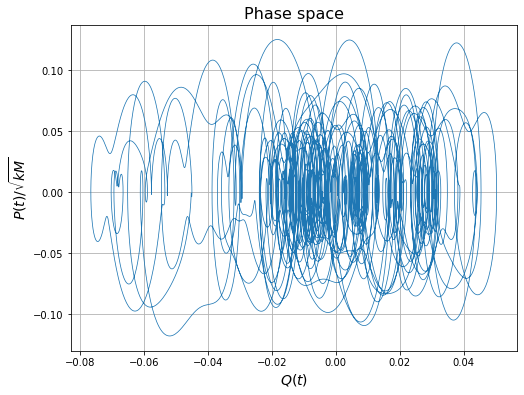

In [120]:
plt.figure(figsize = (8,6))
plt.plot(Q,P/np.sqrt(k*M), lw = 0.75)

plt.title("Phase space", fontsize = 16)
plt.xlabel("$Q(t)$", fontsize = 14)
plt.ylabel("$P(t)/\sqrt{kM}$", fontsize = 14)
plt.grid()
plt.show()

### Coarse-grained model: Langevin dynamics

As we have seen in the above example, the full model has quite a lot of details and is quite computationally extensive to run.<br> 
However, if we want to just capture the dynamic of the "slow" degree of freedom (the heavy mass), we can resort to the Langevin dynamic. <br>
<br>
Langevin equation:
\begin{equation}
\frac{dP}{dt} = F(P) + \sqrt{2D_P}\zeta(t)
\end{equation}
where $\zeta(t)$ is an uncorrelated Gaussian white noise with zero mean
\begin{equation}
\langle \zeta(t) \rangle = 0\quad,\quad \langle \zeta(t)\zeta(t') \rangle = \delta(t-t')
\end{equation}

But to make it suitable for simulation on a computer we have to rewrite it a little bit in terms of stochastic ODE in Ito calculus sense, so that we have the Ito-Langevin equation:
\begin{equation}
dP_t = F(P_t)dt + \sqrt{2D_P}dW_t
\end{equation}
where $dW_t$ is the stochastic increment of the $\textbf{Wiener process}$.

Now, lets obtain a long time series of $P(t)$ from the harmonic chain system and try to reconstruct $F(P), D_P$ from the data. 

In [136]:
# half of number of small oscillators
N = 100

# for N = 200 (total 401 oscillators, dt = 0.001, T = 10) it takes about 45 seconds to run
# for N = 100 (total 201 oscillators, 200000 timesteps) it takes about 6 mins to run

# physical parameters
M = 200
m = 1
k = 1000

# initial condition
Q0 = 2*np.random.rand(2*N+1)-1
P0 = np.zeros(2*N+1)    # all have zero initial momenta
X_init = np.hstack( (Q0,P0) )

T = 200 # time from t = 0 to t = T

# solve it
# dense_output = True allows the solution to be interpolated
sol_trial = solve_ivp(HarmonicChain, [0, T], X_init, args = [M,m,k], dense_output=True,
                method="RK45", max_step=0.001)

In [137]:
# obtain the solution for positions and momenta separately
X = sol_trial.y.T
qsol = X[:,0:2*N+1]
psol = X[:,2*N+1:]

# position and momentum of the heavy oscillator
Q = qsol[:,N]
P = psol[:,N]

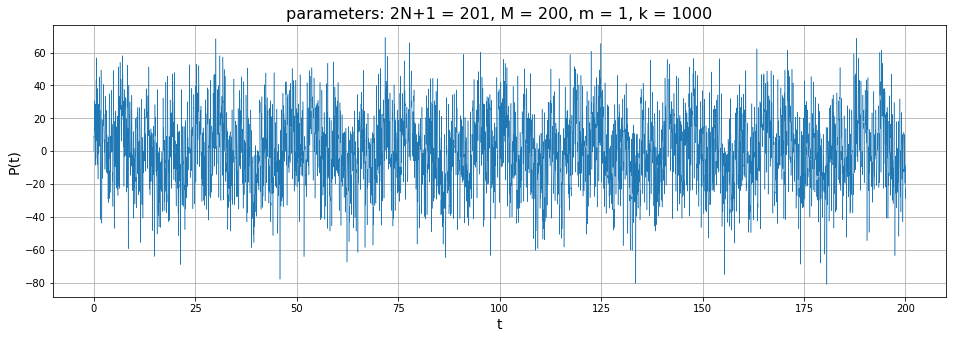

In [147]:
plt.figure(figsize = (16,5))
plt.title(f"parameters: 2N+1 = {2*N+1}, M = {M}, m = {m}, k = {k}", fontsize = 16)
plt.plot(sol_trial.t, P, lw = 0.5)
plt.xlabel("t", fontsize = 14)
plt.ylabel("P(t)", fontsize = 14)
plt.grid()
plt.show()

we can check that the distribution of momentum is quite Gaussian

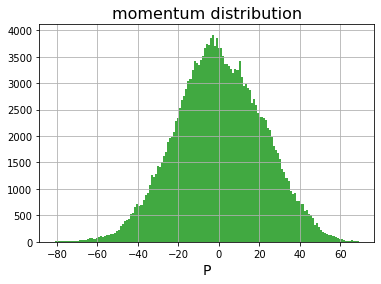

In [212]:
plt.title("momentum distribution", fontsize = 16)
plt.hist(P, bins='auto', color = "tab:green", alpha = 0.9, density = False)
plt.xlabel("P", fontsize = 14)
plt.grid()
plt.show()

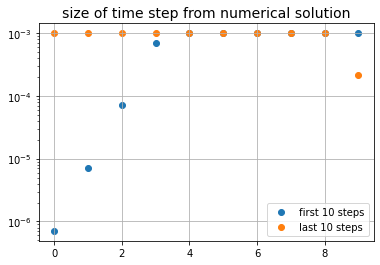

In [200]:
plt.figure()
plt.title("size of time step from numerical solution",fontsize = 14)
plt.scatter(range(10),np.diff(sol_trial.t)[:10], label = "first 10 steps")
plt.scatter(range(10),np.diff(sol_trial.t)[-10:],label = "last 10 steps")
plt.yscale("log")
plt.legend()
plt.grid()
plt.show()

In [187]:
Pt = P[4:-1]    # pick by hand
# divide range of Pt into many box of size Pbox 
nbox = 50
Pval = np.linspace(np.min(Pt), np.max(Pt), nbox+1)
Pbox = Pval[1]-Pval[0]
Pval = Pval[:-1] + Pbox/2